# Aircraft detection

In this Jupiter notebook, I have written to detect airplanes. The data comes from a fiber optic cable running from the Seattle campus of the University of Washington north to the Bothell campus. Most of the fiber optic cable is underground, but some sections hang in the air. The sections of the fiber optic cable that hang in the air are very 'noisy', meaning that mostly wind and the vibration of the cable in the wind can be seen. I wanted to use these sections to detect planes. Therefore, I filter out the low frequencies with a 'highpass' filter. Unfortunately, I didn't manage to find an airplane or any other event in this section of the cable. 

## Literature
I found two papers which discuss aircraft detections. One of these was with a dense Geophone array(Meng & Ben-Zion, 2018). They observed air traffic between 10 - 200 Hz. The other was with a fiber optic cable which was/is trenched (Cai et al., 2021). This publication focused on low frequencies below 5 Hz. At AGU22, I found a poster from Chengping Chai with plane detections with DAS above 80 Hz. The 'seadasn' cable is sampling at 100 Hz. That means we can resolve only up to 50 Hz (Nyquist Frequency). To use the part of the fiber hanging in the air, we need frequencies at which we can hear the plane (20-20k Hz). But I could not find any aircraft by filtering above 20 Hz. Therefore I conclude that the wind introduces noise over a broad frequency band. But also by looking at the buried cable part I could not find any signals from an aircraft, neither at low frequencies nor at high frequencies.

## Notebook
The notebook has four times one minute from an airplane overflight as variable t0 in the second cell. Unfortunately, none of the overflights is visible.

Since plains fly fast, they cover a large distance in a short time. To see the planes better I look at short time windows (10 s with 5 s overlap). At the beginning of the project, I focused only on the cable sections in the air. But then I noticed that the planes pass this section in a very short time. to compare the 'noisy' data from the cable section in the air with the quieter sections, I normalize the data with the median of one channel over the flattened 10 s. However, I was unable to find an aircraft in the data. I also flattened the non-normalized data. To keep the output/plots available in the script I did the normalization in an extra cell and did not just uncomment the lines. So you can compare the normalized plots with the non-normalized plots. I did the same for the filtered plots. I have tested different filters. The output currently shows a highpass filter above 1 Hz.

Since in the above work the doppler shift was always visible in the spectrogram, I also flattened a spectrogram. since I did not find any planes it is not surprising that I do not see any doppler shift in the spectrogram.

## Content
- [1. Choose the following parameters to select data to examine](#1)
- [2. Run the functions to return the data](#2)
- [3. Use $attrs$ to see the aquisition parameters](#3)
- [4. Make a simple overview plot of the data](#4)
    - [4.1 Normalization](#4.1)
    - [4.2 Zoom in](#4.2)
- [5. Plot a spectrogram](#5)
- [6. Plot short time windows](#6)
    - [6.1 Normalization](#6.1)
    - [6.2 Apply a Filter](#6.2)
    - [6.3 Filter & Normalization](#6.3)
    - [6.4 Zoom in](#6.4)

In [199]:
from dasquakes import *
import datetime
import numpy as np
import matplotlib.pyplot as plt

<a id='1'></a>
# 1. Choose the following parameters to select data to examine

In [206]:
cable='seadasn'
record_length = 3 #minutes
# one minute before an aircraft passes by
# t0 = datetime.datetime(2022, 11, 30, 18, 21)
# t0 = datetime.datetime(2022, 12, 2, 21, 47)
t0 = datetime.datetime(2022, 12, 2, 23, 1)
# t0 = datetime.datetime(2022, 12, 6, 15, 38)

<a id='2'></a>
# 2. Run the functions to return the data

In [207]:
prefix, network_name, datastore = data_wrangler(cable,record_length,t0)

data,dates,attrs = open_sintela_file(prefix,
                                     t0,
                                     datastore,
                                     number_of_files=record_length,
                                     verbose=False)

<a id='3'></a>
# 3. Use $attrs$ to see the aquisition parameters

In [208]:
nt = data.shape[0]
nx = data.shape[1]
fs = attrs['PulseRate']
print(f'Number of time steps: {nt}, Number of channels: {nx}')

print (f"Nyquist Frequency: {attrs['MaximumFrequency']} Hz, cable length: {attrs['SpatialSamplingInterval']*nx} m")

Number of time steps: 18000, Number of channels: 2088
Nyquist Frequency: 50.0 Hz, cable length: 9992.571672632936 m


In [210]:
data = data.transpose() # time, distance

<a id='4'></a>
# 4. Make a simple overview plot of the data

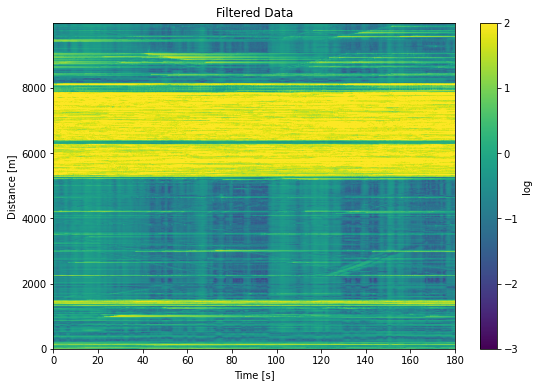

In [138]:
# plot all data
plt.subplots(figsize=(9,6))
plt.imshow(np.log10(np.abs(data)),aspect='auto',vmin=-3,vmax=2, 
           origin='lower',
            extent=[0,nt/attrs['PulseRate'],0,attrs['SpatialSamplingInterval']*nx])
plt.title('Filtered Data')
plt.xlabel('Time [s]')
plt.ylabel('Distance [m]')
plt.colorbar(label='log')

<a id='4.1'></a>
### 4.1 Normalization

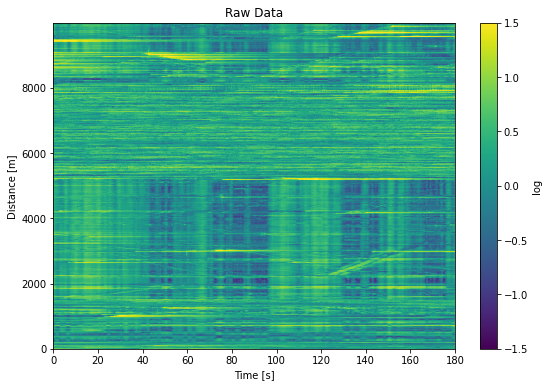

In [142]:
# average amplitude
white_data = data / np.median(data, axis=1)[:,None] # subdract mean over whole cable from each channel
plt.subplots(figsize=(9,6))
plt.imshow(np.log10(np.abs(white_data)),aspect='auto',vmin=-1.5,vmax=1.5, origin='lower',
            extent=[0,nt/attrs['PulseRate'],0,attrs['SpatialSamplingInterval']*nx])
plt.title('Raw Data')
plt.xlabel('Time [s]')
plt.ylabel('Distance [m]')
plt.colorbar(label='log')

<a id='4.2'></a>
### 4.2 Zoom in

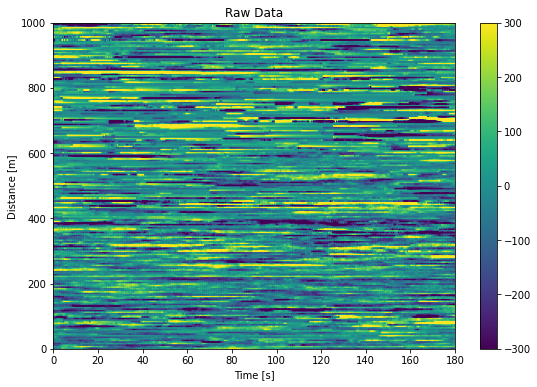

In [26]:
# select data and plot the selected part
min_dist = 6500 # min distance in m
max_dist = 7500 # max distance in m
min_time = 0 # min time in s
max_time = 180 # max time in s

min_chan = int(min_dist/attrs['SpatialSamplingInterval'])
max_chan = int(max_dist/attrs['SpatialSamplingInterval'])
t_start = int(min_time*attrs['PulseRate'])
t_end = int(max_time*attrs['PulseRate'])

my_data = data[min_chan:max_chan,t_start:t_end]
plt.subplots(figsize=(9,6))
plt.imshow(my_data,aspect='auto',vmin=-300,vmax=300, origin='lower',
            extent=[0,max_time-min_time,0,max_dist-min_dist])
plt.title('Raw Data')
plt.xlabel('Time [s]')
plt.ylabel('Distance [m]')
plt.colorbar()

<a id='5'></a>
# 5. Plot a spectrogram

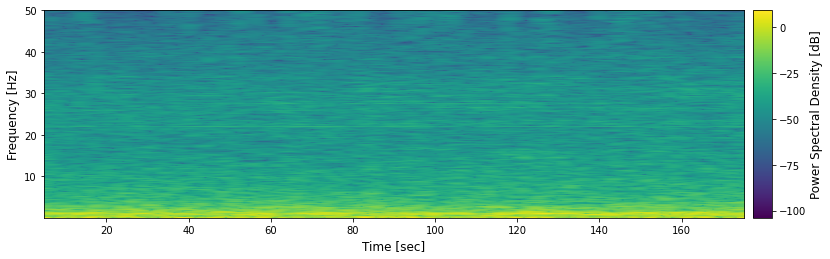

In [262]:
tr_data = np.mean(data, axis=0)
#tr_data = data[1000,:] # channel, time

NFFT = fs * 10 # bin size for fourier transform. Type in length (seconds)

fig = plt.figure(figsize=(6.4*2,4.8)) #create figure and add axes to it
# ax1 = fig.add_axes([0.1, 0.1, 0.7, 0.60]) #[left bottom width height]
# ax2 = fig.add_axes([0.83, 0.1, 0.03, 0.6])
ax1 = fig.add_axes([0.125, 0.125, 0.76, 0.6])
ax2 = fig.add_axes([0.895, 0.125, 0.02, 0.6]) # colorbar

#plot spectrogram on first axis
Pxx, freqs, bins, im = ax1.specgram(tr_data, NFFT=int(NFFT), Fs=fs,
                                    noverlap=int(NFFT*0.95),         # overlap of bins in samples
                                    detrend='linear',   # detrending before taking fourier transform
                                    mode='psd',         # 'psd', 'magnitude', 'angle', 'phase'
                                    scale_by_freq=True, # unit/Hz
                                    scale='dB',         #'linear', 'dB'
                                    cmap='viridis',     # your favourite colormap
#                                     vmin=-40,
#                                     vmax=-20,
                                   )


ax1.set_xlabel('Time [sec]', fontsize=12) #x-label
ax1.set_ylabel('Frequency [Hz]', fontsize=12) #y-label

#ax1.set_yscale('log')
ax1.set_ylim(0.01,50) #be carefull with lower limit when y-scale is logarithmic

cbar = plt.colorbar(im, cax=ax2) #map colorbar to image (output of specgram), plot it on ax2
cbar.set_label('Power Spectral Density [dB]', fontsize=12) #colorbar label
cbar.ax.locator_params(nbins=5)

# fig.savefig('spectrogram.png', dpi=300, bbox_inches='tight')
plt.show()

<a id='6'></a>
# 6. Plot short time windows

In [265]:
# parameter setting
# make an array with start times (add an overlap if you wish)
start_times = np.arange(0,int(data.shape[1]/fs),15) # starttimes in sec
print(start_times)
# define the time window length in seconds
time_len = 30

[  0  15  30  45  60  75  90 105 120 135 150 165]


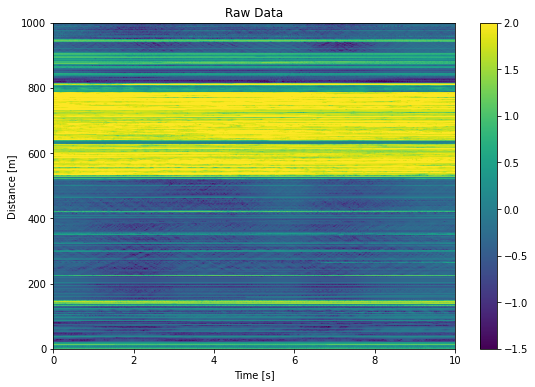

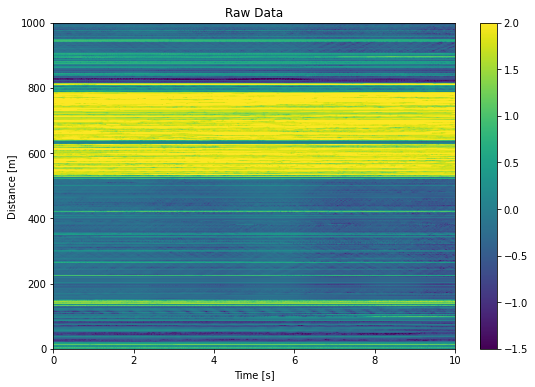

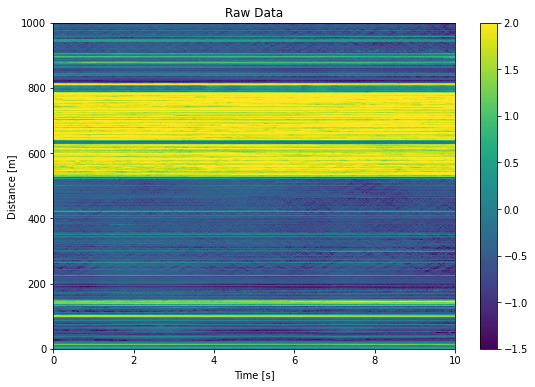

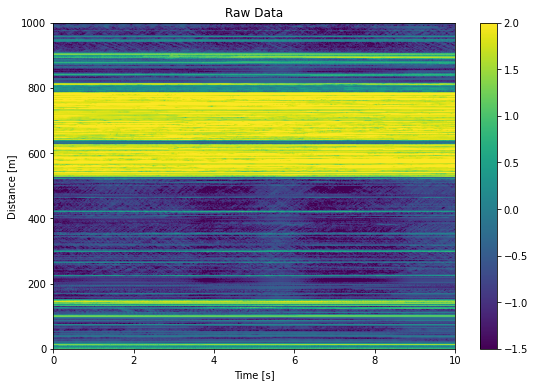

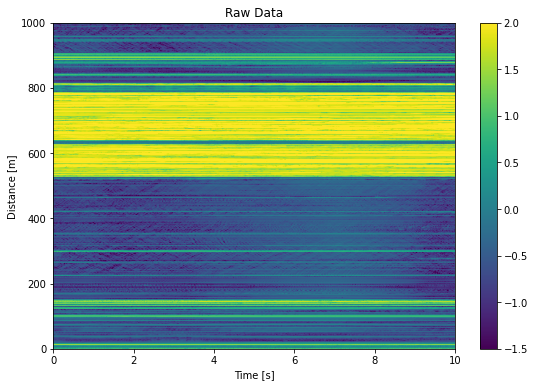

...

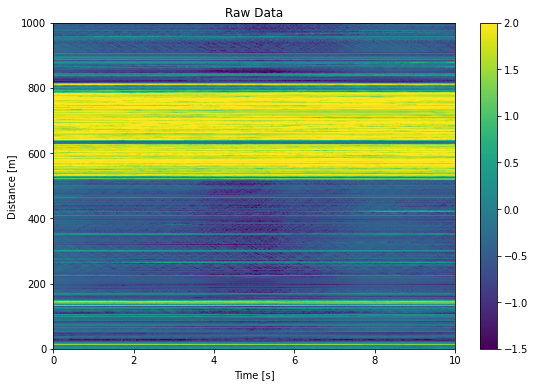

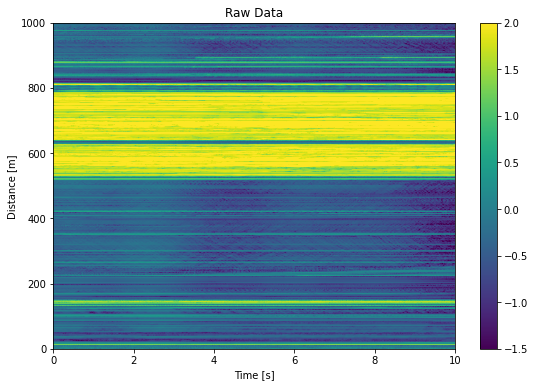

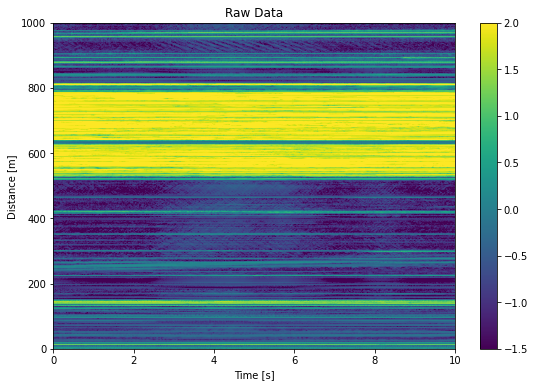

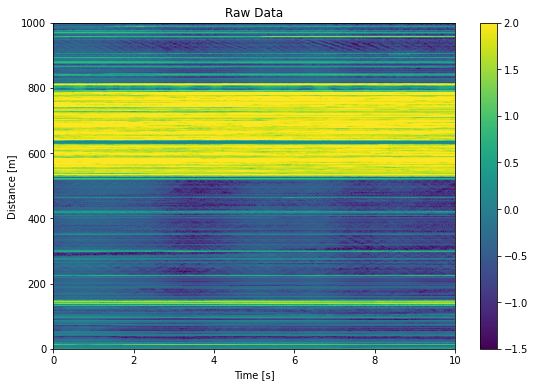

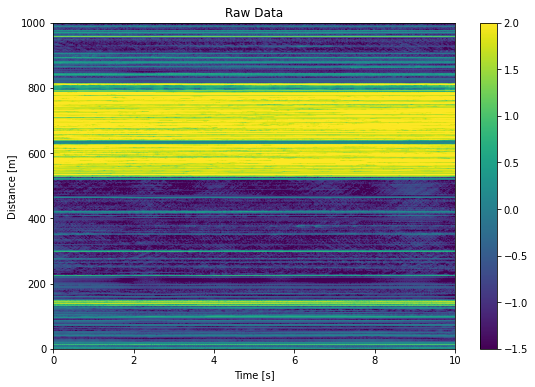

In [224]:
for start_time in start_times:
    # select data and plot the selected part
    min_time = start_time # min time in s
    max_time = start_time+time_len # max time in s

    t_start = int(min_time*attrs['PulseRate'])
    t_end = int(max_time*attrs['PulseRate'])

    my_data = data[:,t_start:t_end]

    plt.subplots(figsize=(9,6))
    plt.imshow(np.log10(np.abs(my_data)),aspect='auto',vmin=-1.5,vmax=2, origin='lower',
            extent=[0,max_time-min_time,0,max_dist-min_dist])
    plt.title('Raw Data')
    plt.xlabel('Time [s]')
    plt.ylabel('Distance [m]')
    plt.colorbar()
    plt.show()
    #plt.savefig('plot_noise/abs_st{}.png'.format(start_time))

<a id='6.1'></a>
### 6.1 Normalization

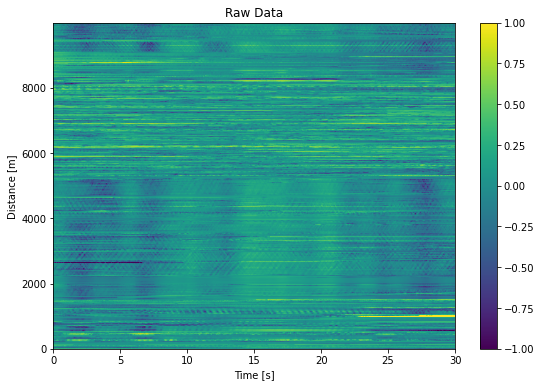

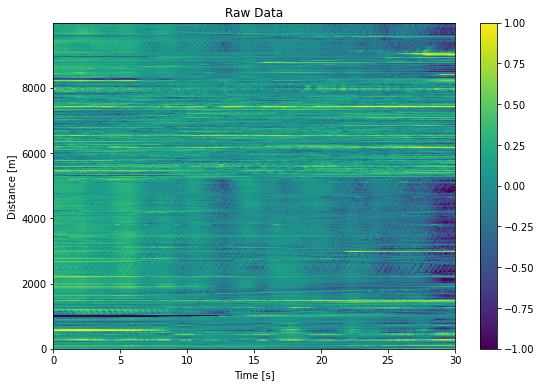

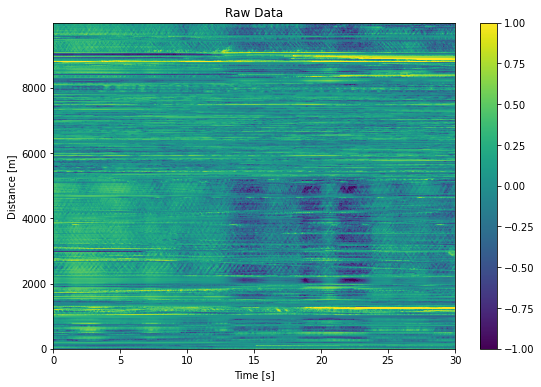

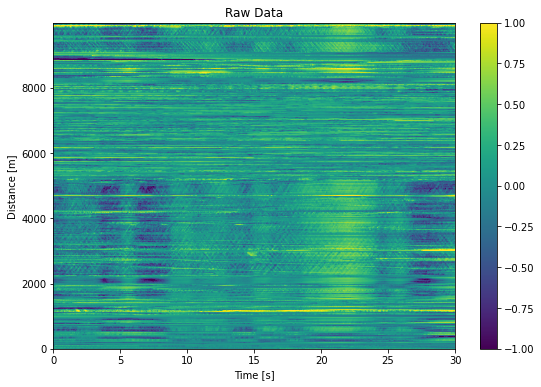

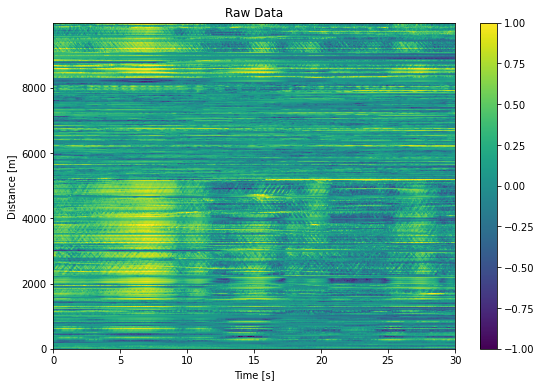

...

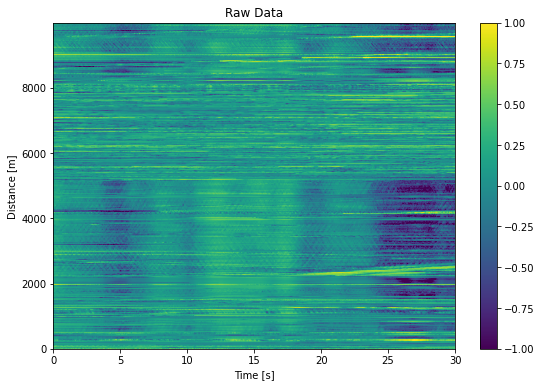

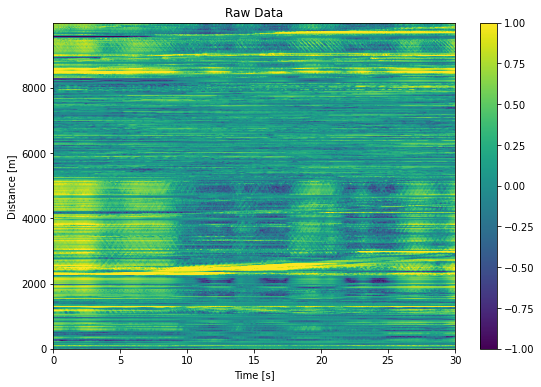

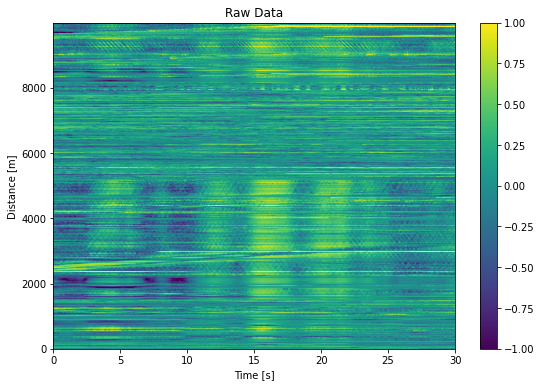

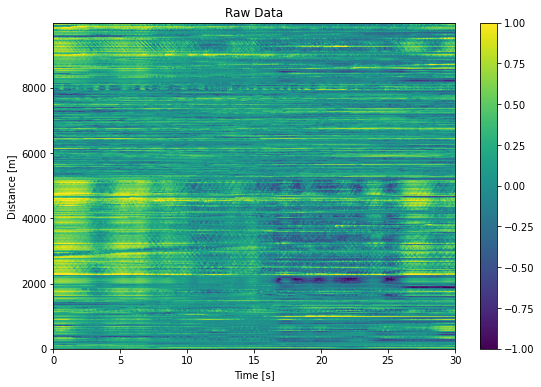

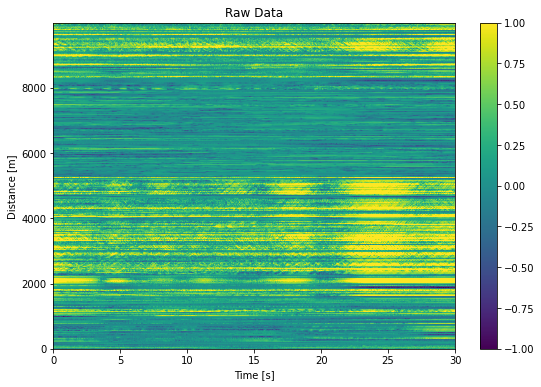

In [222]:
for start_time in start_times:
    # select data and plot the selected part
    min_time = start_time # min time in s
    max_time = start_time+time_len # max time in s

    t_start = int(min_time*attrs['PulseRate'])
    t_end = int(max_time*attrs['PulseRate'])

    my_data = data[:,t_start:t_end]
    
    white_data = my_data / np.median(my_data, axis=1)[:,None] # subdract mean over whole cable from each channel
    
    plt.subplots(figsize=(9,6))
    plt.imshow(np.log10(np.abs(white_data)),aspect='auto',vmin=-1,vmax=1, origin='lower',
                extent=[0,max_time-min_time,0,attrs['SpatialSamplingInterval']*nx])
    plt.title('Raw Data')
    plt.xlabel('Time [s]')
    plt.ylabel('Distance [m]')
    plt.colorbar()
    plt.show()
    #plt.savefig('plot_noise/white_st{}.png'.format(start_time))

<a id='6.2'></a>
### 6.2 Apply a filter

In [139]:
from scipy.signal import sosfiltfilt, butter, filtfilt, detrend
from scipy.fftpack import fft, ifft, fftfreq, next_fast_len

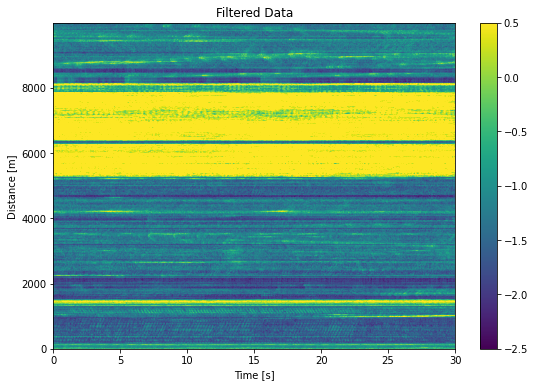

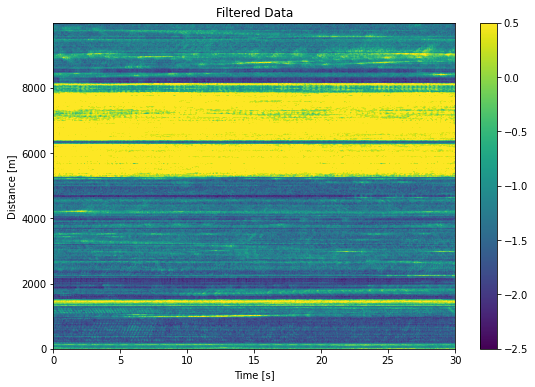

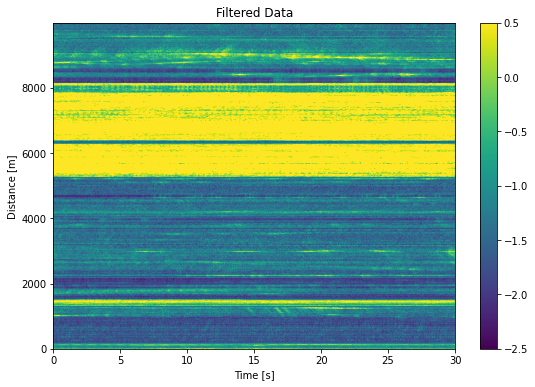

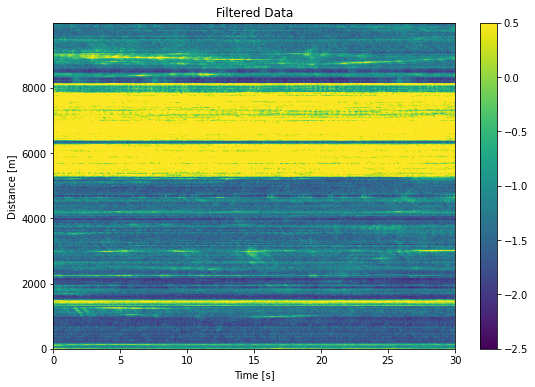

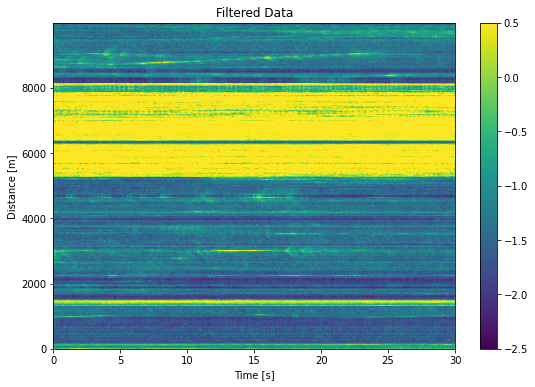

...

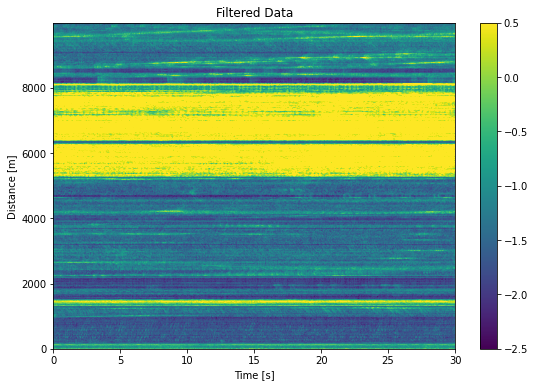

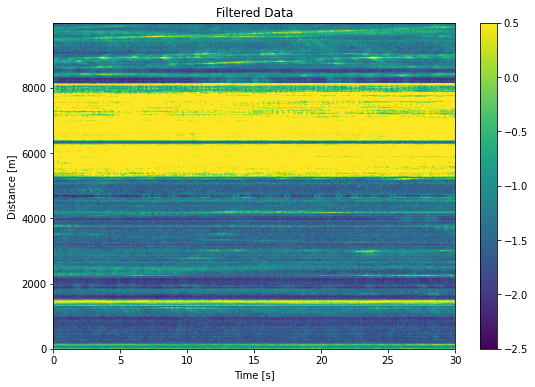

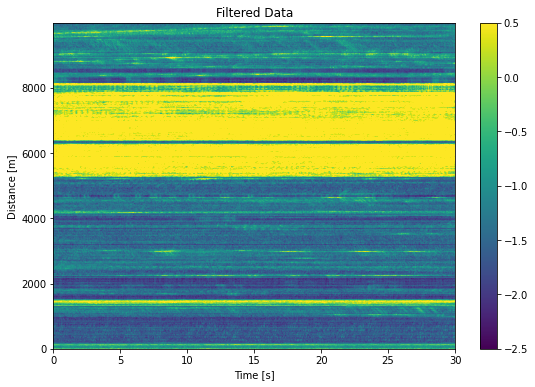

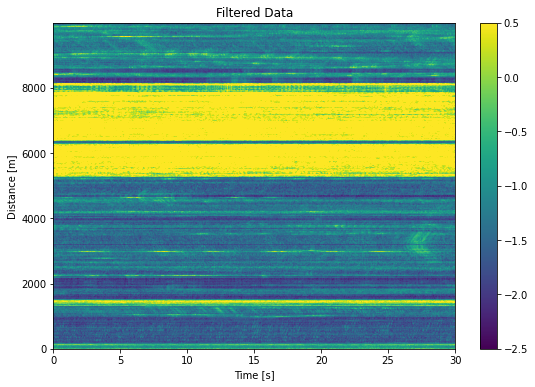

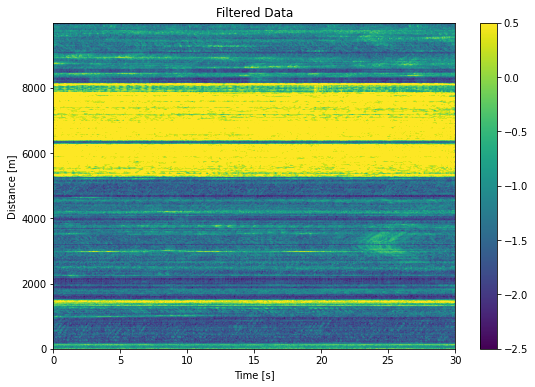

In [268]:
# apply lowpass bandpass and highpass filter
sos = butter(4, 1, 'highpass', fs=fs, output='sos') # order=4

for start_time in start_times:
    # select data and plot the selected part
    min_time = start_time # min time in s
    max_time = start_time+time_len # max time in s

    t_start = int(min_time*attrs['PulseRate'])
    t_end = int(max_time*attrs['PulseRate'])

    my_data = data[:,t_start:t_end]
    
#    white_data = my_data / np.median(my_data, axis=1)[:,None] # subdract mean over whole cable from each channel
    
    filt_my_data = sosfiltfilt(sos, my_data, axis=1)
    
    plt.subplots(figsize=(9,6))
    plt.imshow(np.log10(np.abs(filt_my_data)),aspect='auto',vmin=-2.5,vmax=0.5, origin='lower',
                extent=[0,max_time-min_time,0,attrs['SpatialSamplingInterval']*nx])
#     plt.imshow(np.log10(np.abs(white_data)),aspect='auto',vmin=-1,vmax=1, origin='lower',
#                 extent=[0,max_time-min_time,0,attrs['SpatialSamplingInterval']*nx])
    plt.title('Filtered Data')
    plt.xlabel('Time [s]')
    plt.ylabel('Distance [m]')
    plt.colorbar()
    plt.show()
    #plt.savefig('plot_noise/filt_st{}.png'.format(start_time))

<a id='6.3'></a>
### 6.3 Filter & Normalization

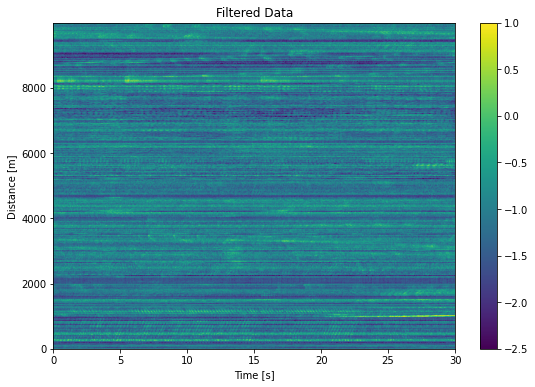

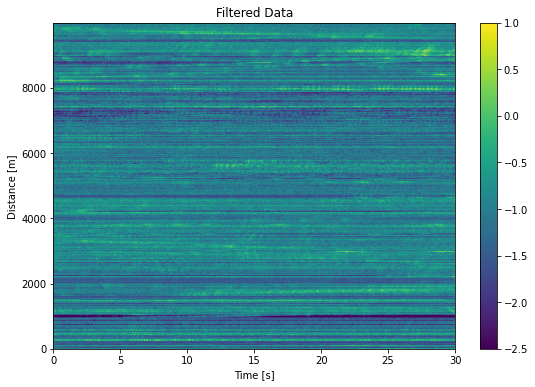

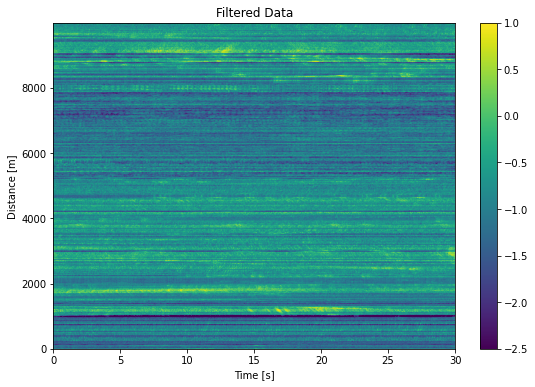

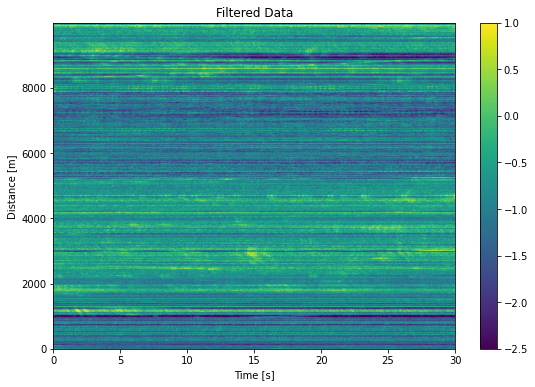

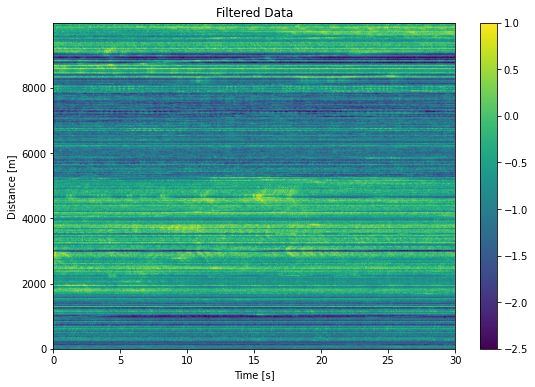

...

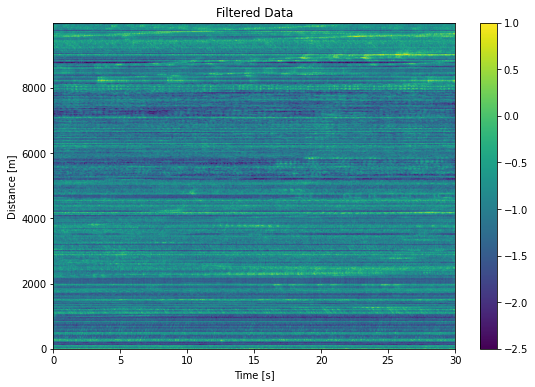

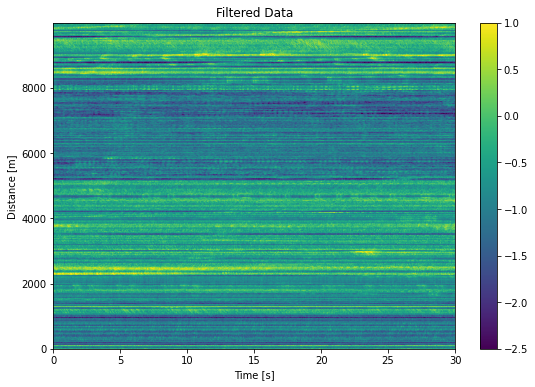

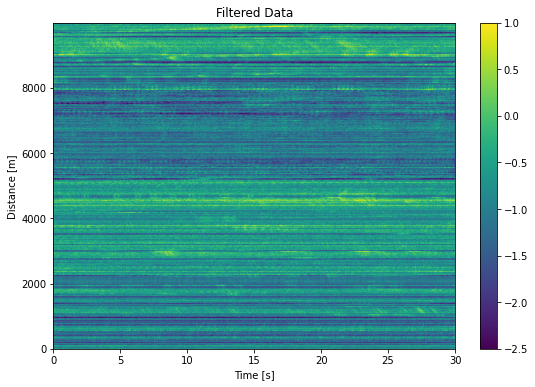

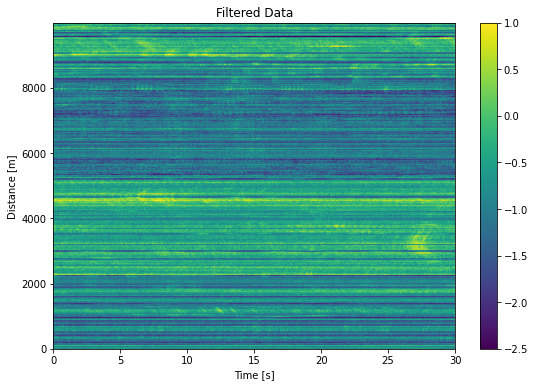

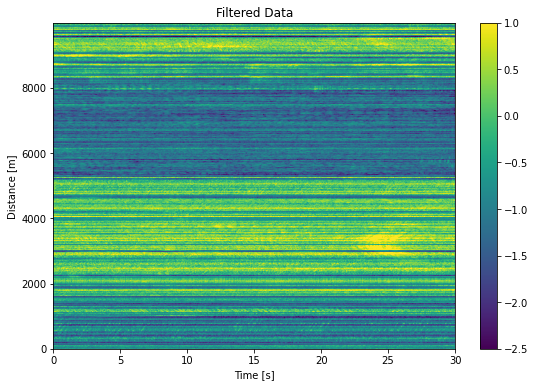

In [270]:
# apply lowpass bandpass and highpass filter & normalize
sos = butter(4, 1, 'highpass', fs=fs, output='sos') # order=4

for start_time in start_times:
    # select data and plot the selected part
    min_time = start_time # min time in s
    max_time = start_time+time_len # max time in s

    t_start = int(min_time*attrs['PulseRate'])
    t_end = int(max_time*attrs['PulseRate'])

    my_data = data[:,t_start:t_end]
    
    white_data = my_data / np.median(my_data, axis=1)[:,None] # subdract mean over whole cable from each channel
    
    filt_white_data = sosfiltfilt(sos, white_data, axis=1)
    
    plt.subplots(figsize=(9,6))
    plt.imshow(np.log10(np.abs(filt_white_data)),aspect='auto',vmin=-2.5,vmax=1, origin='lower',
                extent=[0,max_time-min_time,0,attrs['SpatialSamplingInterval']*nx])
    plt.title('Filtered Data')
    plt.xlabel('Time [s]')
    plt.ylabel('Distance [m]')
    plt.colorbar()
    plt.show()
    #plt.savefig('plot_noise/filt_white_st{}.png'.format(start_time))

<a id='6.4'></a>
### 6.4 Zoom in 

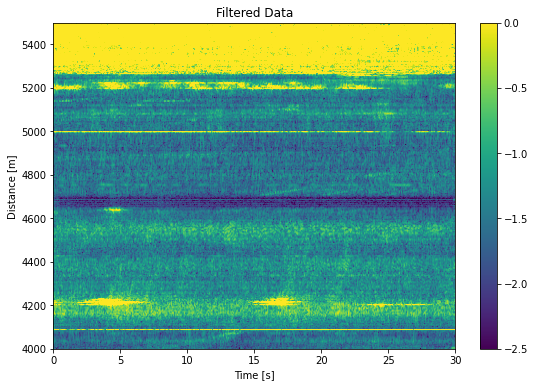

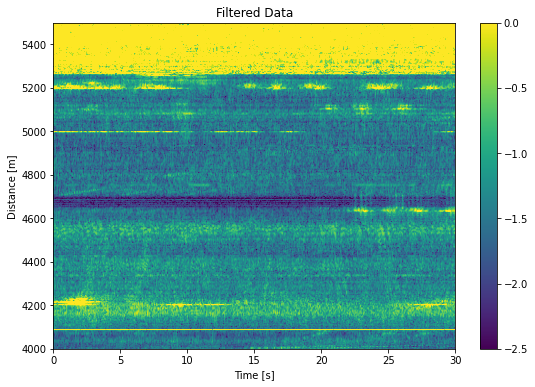

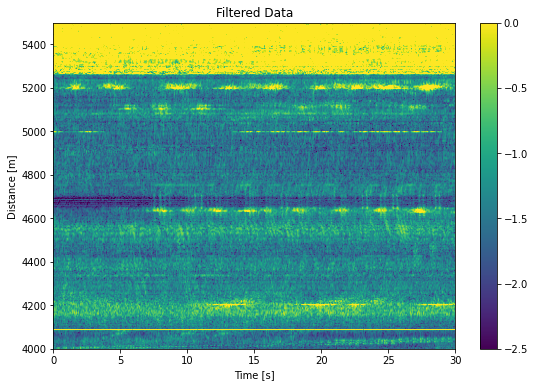

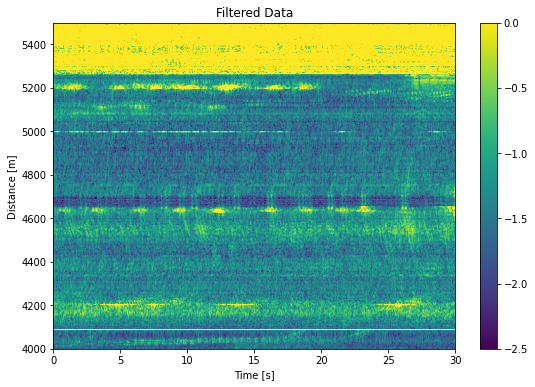

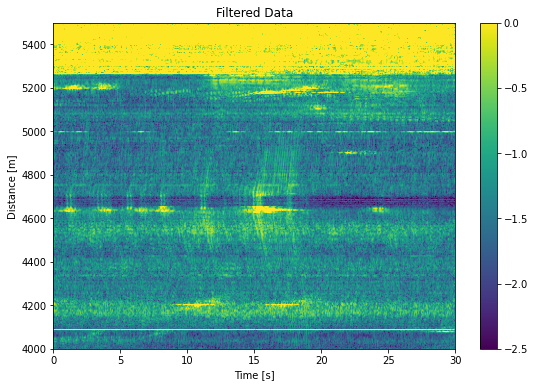

...

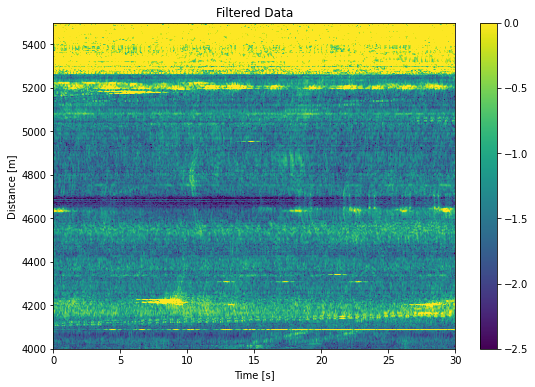

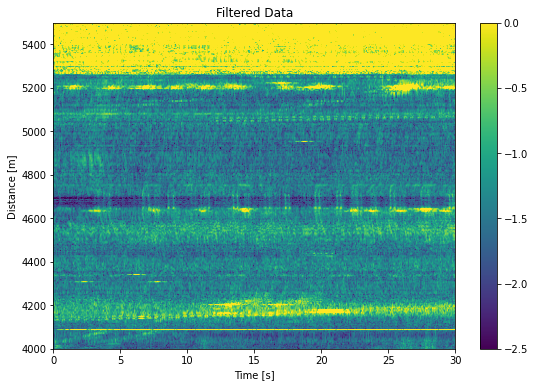

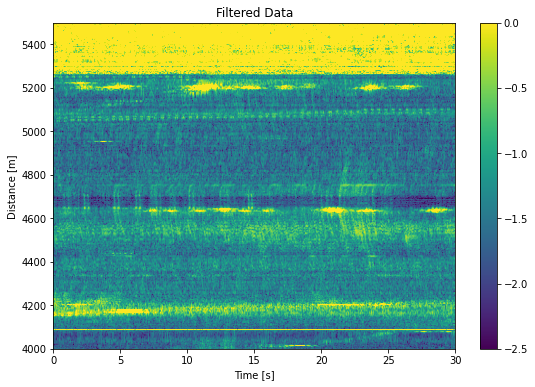

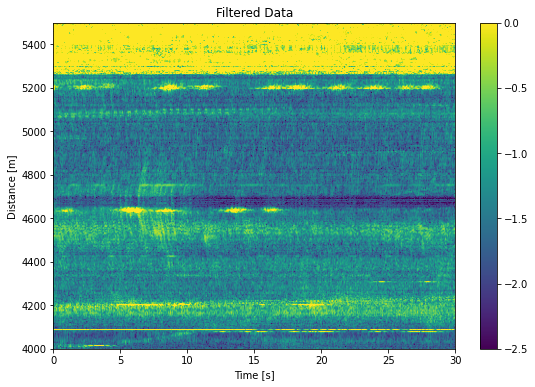

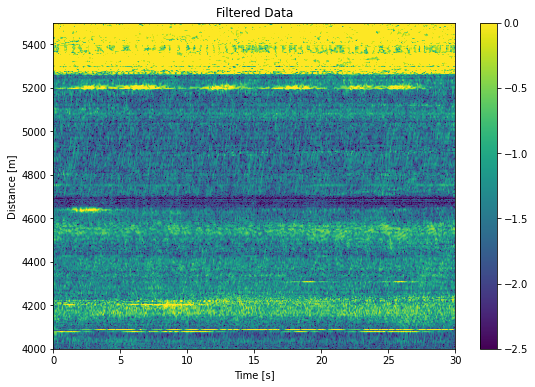

In [247]:
# zoome in the distance

min_dist = 4000 # min distance in m
max_dist = 5500 # max distance in m

sos = butter(4, 1, 'highpass', fs=fs, output='sos') # order=4

for start_time in start_times:
    # select data and plot the selected part
    min_time = start_time # min time in s
    max_time = start_time+time_len # max time in s

    t_start = int(min_time*attrs['PulseRate'])
    t_end = int(max_time*attrs['PulseRate'])
    min_chan = int(min_dist/attrs['SpatialSamplingInterval'])
    max_chan = int(max_dist/attrs['SpatialSamplingInterval'])

    my_data = data[min_chan:max_chan,t_start:t_end]
    
#    white_data = my_data / np.median(my_data, axis=1)[:,None] # subdract mean over whole cable from each channel
    
    filt_my_data = sosfiltfilt(sos, my_data, axis=1)
    
    plt.subplots(figsize=(9,6))
    plt.imshow(np.log10(np.abs(filt_my_data)),aspect='auto',vmin=-2.5,vmax=0, origin='lower',
                extent=[0,max_time-min_time,min_dist,max_dist])
#     plt.imshow(np.log10(np.abs(white_data)),aspect='auto',vmin=-1,vmax=1, origin='lower',
#                 extent=[0,max_time-min_time,0,attrs['SpatialSamplingInterval']*nx])
    plt.title('Filtered Data')
    plt.xlabel('Time [s]')
    plt.ylabel('Distance [m]')
    plt.colorbar()
    plt.show()